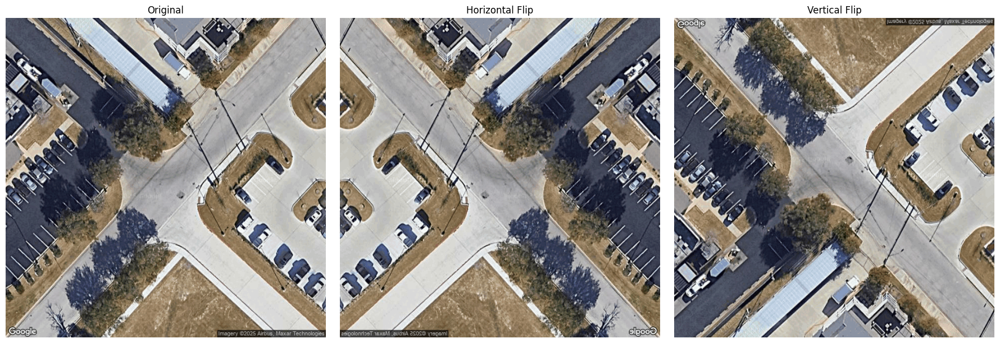

In [2]:
import os
from matplotlib import pyplot as plt
import cv2

# Pick a sample image from the downloaded_tiles folder
sample_img_path = os.path.join("downloaded_tiles", os.listdir("downloaded_tiles")[0])
img = cv2.imread(sample_img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Apply horizontal and vertical flipping
img_hflip = cv2.flip(img_rgb, 1)  # Horizontal flip
img_vflip = cv2.flip(img_rgb, 0)  # Vertical flip

# Plot original, horizontal flip, and vertical flip
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(img_rgb)
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(img_hflip)
axes[1].set_title("Horizontal Flip")
axes[1].axis("off")

axes[2].imshow(img_vflip)
axes[2].set_title("Vertical Flip")
axes[2].axis("off")

plt.tight_layout()
plt.show()

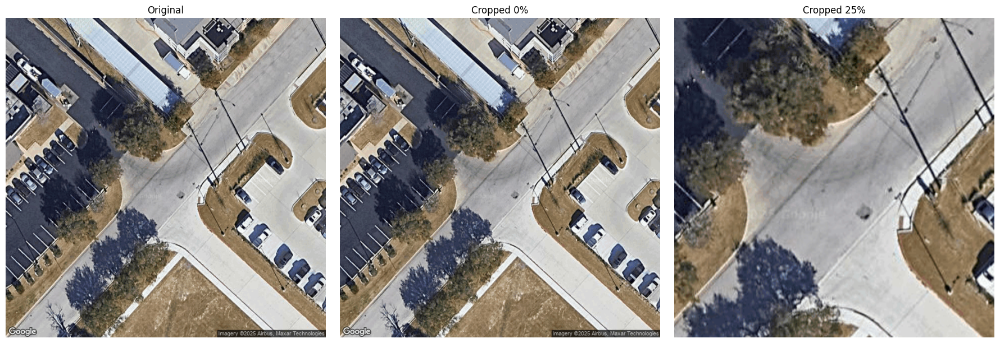

In [3]:
def crop_center(img, crop_percent):
    """
    Crop the center of the image by a given percentage.
    crop_percent: float in [0, 1], e.g., 0.25 means crop 25% from each side.
    Returns the cropped image.
    """
    if crop_percent < 0 or crop_percent >= 0.5:
        raise ValueError("crop_percent must be in [0, 0.5)")
    h, w = img.shape[:2]
    ch = int(h * (1 - crop_percent * 2))
    cw = int(w * (1 - crop_percent * 2))
    start_y = (h - ch) // 2
    start_x = (w - cw) // 2
    return img[start_y:start_y+ch, start_x:start_x+cw]

# Crop by 0% (no crop)
img_crop_0 = crop_center(img_rgb, 0.0)

# Crop by 25% (remove 25% from each side)
img_crop_25 = crop_center(img_rgb, 0.25)

# Show results
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(img_rgb)
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(img_crop_0)
axes[1].set_title("Cropped 0%")
axes[1].axis("off")

axes[2].imshow(img_crop_25)
axes[2].set_title("Cropped 25%")
axes[2].axis("off")

plt.tight_layout()
plt.show()

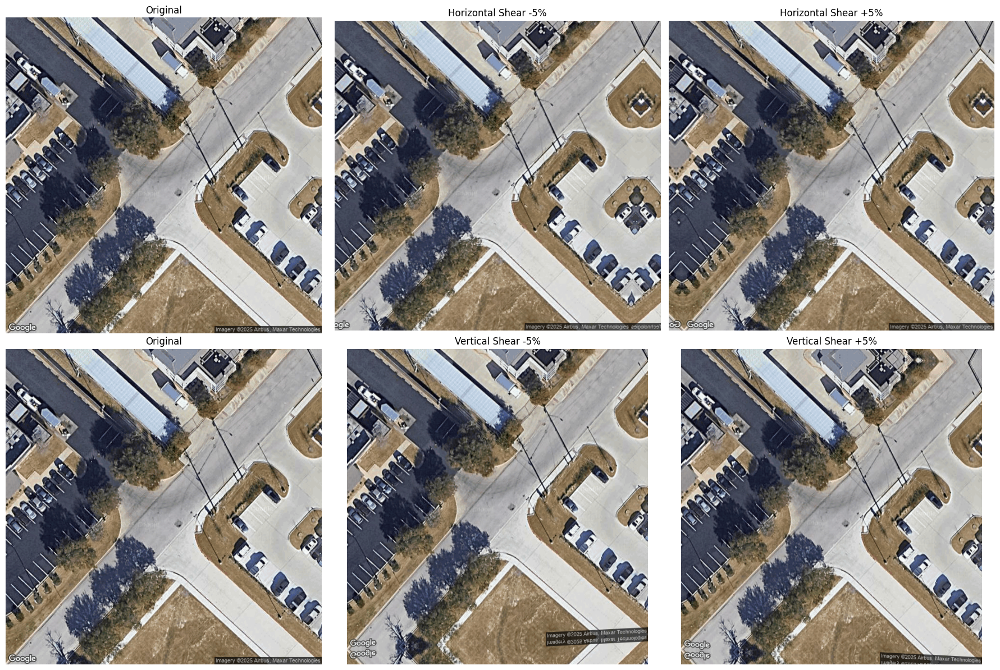

In [4]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def shear_image(img, shear_percent, direction="horizontal"):
    """
    Apply a shear transformation to the image.
    shear_percent: float, e.g., 0.05 for 5% shear
    direction: "horizontal" or "vertical"
    """
    h, w = img.shape[:2]
    if direction == "horizontal":
        M = np.array([[1, shear_percent, 0],
                      [0, 1, 0]], dtype=np.float32)
        nW = int(w + abs(shear_percent) * h)
        sheared = cv2.warpAffine(img, M, (nW, h), borderMode=cv2.BORDER_REFLECT)
    else:  # vertical
        M = np.array([[1, 0, 0],
                      [shear_percent, 1, 0]], dtype=np.float32)
        nH = int(h + abs(shear_percent) * w)
        sheared = cv2.warpAffine(img, M, (w, nH), borderMode=cv2.BORDER_REFLECT)
    return sheared

# Shear values
shear_vals = [-0.05, 0.05]

# Horizontal shear
img_shear_h_neg = shear_image(img_rgb, shear_vals[0], direction="horizontal")
img_shear_h_pos = shear_image(img_rgb, shear_vals[1], direction="horizontal")

# Vertical shear
img_shear_v_neg = shear_image(img_rgb, shear_vals[0], direction="vertical")
img_shear_v_pos = shear_image(img_rgb, shear_vals[1], direction="vertical")

# Plot results
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes[0, 0].imshow(img_rgb)
axes[0, 0].set_title("Original")
axes[0, 0].axis("off")

axes[0, 1].imshow(img_shear_h_neg)
axes[0, 1].set_title("Horizontal Shear -5%")
axes[0, 1].axis("off")

axes[0, 2].imshow(img_shear_h_pos)
axes[0, 2].set_title("Horizontal Shear +5%")
axes[0, 2].axis("off")

axes[1, 0].imshow(img_rgb)
axes[1, 0].set_title("Original")
axes[1, 0].axis("off")

axes[1, 1].imshow(img_shear_v_neg)
axes[1, 1].set_title("Vertical Shear -5%")
axes[1, 1].axis("off")

axes[1, 2].imshow(img_shear_v_pos)
axes[1, 2].set_title("Vertical Shear +5%")
axes[1, 2].axis("off")

plt.tight_layout()
plt.show()

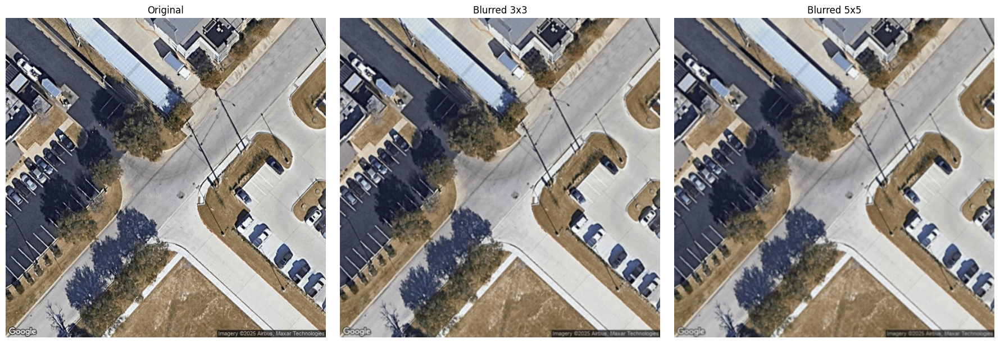

In [5]:
import cv2
from matplotlib import pyplot as plt

# Apply Gaussian blur with kernel size up to 5x5 (5px)
img_blur_3 = cv2.GaussianBlur(img_rgb, (3, 3), 0)
img_blur_5 = cv2.GaussianBlur(img_rgb, (5, 5), 0)

# Show original and blurred images
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(img_rgb)
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(img_blur_3)
axes[1].set_title("Blurred 3x3")
axes[1].axis("off")

axes[2].imshow(img_blur_5)
axes[2].set_title("Blurred 5x5")
axes[2].axis("off")

plt.tight_layout()
plt.show()

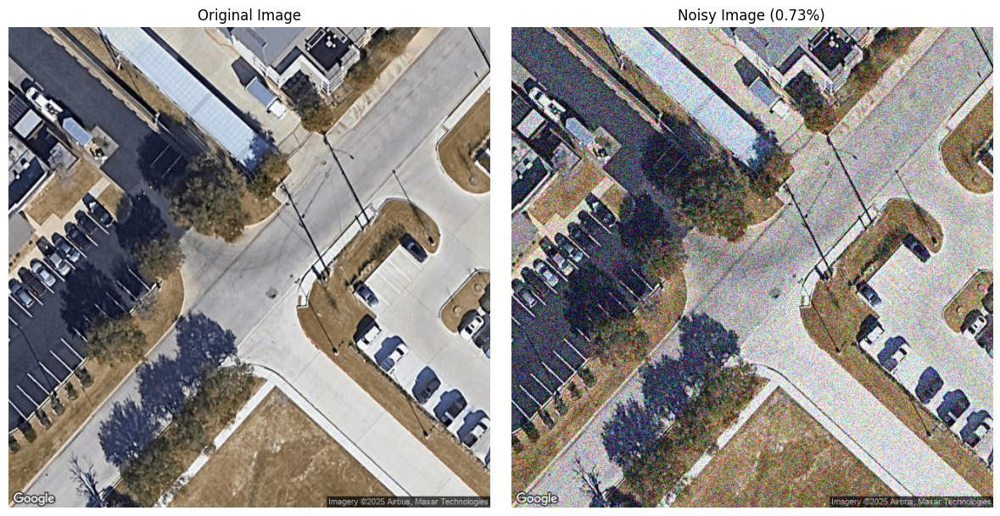

In [6]:
import numpy as np
from matplotlib import pyplot as plt

# Add Gaussian noise (0.73% of max pixel value, i.e., 0.73/100*255 ≈ 1.86)
noise_std = 0.15 * 255
noise = np.random.normal(0, noise_std, img_rgb.shape).astype(np.float32)
img_noise = np.clip(img_rgb.astype(np.float32) + noise, 0, 255).astype(np.uint8)

# Plot original and noisy images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(img_rgb)
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(img_noise)
axes[1].set_title("Noisy Image (0.73%)")
axes[1].axis("off")

plt.tight_layout()
plt.show()